In [1]:
from acquire import *
from prepare import *
from preprocess import *
from model import *
# ignore warnings
import warnings
warnings.filterwarnings("ignore")

## Objectives:
- Document the data science pipeline. Ensure the findings are presented clearly and the documentation is clear enough for independent reproduction
- Create modules that can be downloaded for the sake of reproducibility.






## Project Description and goals:

- The goal is to use data to find and explore predictive factors of churn.
- Ultimately we hope to use these factors to drive actions which help to maintain a strong customer base and drive  profits.


## Questions:

Generally we would ask what relationships that might affect churn?

Is there a distinguishable relationship between household size and churn?

>This required some feature engineering.

Is there a relationship between churn and paperless billing?

Is there a correlation between customer duration and monthly charges?

- If so, how strong is it?

Due total charges have a relationship with churn?



# Acquire:
Acquire is simply that. Here we obtain the data using the aquire.py file. This runs an sql database query which stores the data to a csv locally for further manipulation in subsequent steps.




# Prepare:

This step is substantial. Here clean the data. We split it to avoid biasing our analysis. From here we make inferences on the data.  We do slightly expand on these in the next step after we have tidy data. Yet most of the heavy lifting is done at this stage as we see visualizations and conduct statistical testing in this step. Our prepare.py file cleans the data and imputes the mean after our data is split. This was imperative to do after the split to mitigate data poisoning. 

This is the Cleaned Dataset:





,gender_encoded,partner_encoded,dependents_encoded,phone_service_encoded,paperless_billing_encoded,churn_encoded,total_in_household,senior_citizen,tenure,multiple_lines,...,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,monthly_charges,total_charges,contract_type,internet_service_type,payment_type
head_1,1,1,1,1,1,0,3,0,9,No,...,Yes,No,Yes,Yes,No,65.6,593.3,One year,DSL,Mailed check
head_2,0,0,0,1,0,0,1,0,9,Yes,...,No,No,No,No,Yes,59.9,542.4,Month-to-month,DSL,Mailed check
head_3,0,0,0,1,1,1,1,0,4,No,...,No,Yes,No,No,No,73.9,280.85,Month-to-month,Fiber optic,Electronic check
dtypes,int64,int64,int64,int64,int64,int64,int64,int64,int64,object,...,object,object,object,object,object,float64,object,object,object,object
count,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043,...,7043,7043,7043,7043,7043,7043.0,7043,7043,7043,7043
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,...,3,3,3,3,3,NaN,6531,3,3,4
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,...,No,No,No,No,No,NaN,,Month-to-month,Fiber optic,Electronic check
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3390,...,3088,3095,3473,2810,2785,NaN,11,3875,3096,2365
mean,0.495244,0.483033,0.299588,0.903166,0.592219,0.26537,1.782621,0.162147,32.371149,NaN,...,NaN,NaN,NaN,NaN,NaN,64.761692,NaN,NaN,NaN,NaN
std,0.500013,0.499748,0.45811,0.295752,0.491457,0.441561,0.816629,0.368612,24.559481,NaN,...,NaN,NaN,NaN,NaN,NaN,30.090047,NaN,NaN,NaN,NaN


(7043, 21)

<AxesSubplot:title={'center':'Unique values per column'}>

,Length,Width
Prepared Data,7043,21
Train,4225,21
Validate,1409,21
Test,1409,21


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4225 entries, 5911 to 3586
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   gender_encoded             4225 non-null   int64  
 1   partner_encoded            4225 non-null   int64  
 2   dependents_encoded         4225 non-null   int64  
 3   phone_service_encoded      4225 non-null   int64  
 4   paperless_billing_encoded  4225 non-null   int64  
 5   churn_encoded              4225 non-null   int64  
 6   total_in_household         4225 non-null   int64  
 7   senior_citizen             4225 non-null   int64  
 8   tenure                     4225 non-null   int64  
 9   multiple_lines             4225 non-null   object 
 10  online_security            4225 non-null   object 
 11  online_backup              4225 non-null   object 
 12  device_protection          4225 non-null   object 
 13  tech_support               4225 non-null   ob

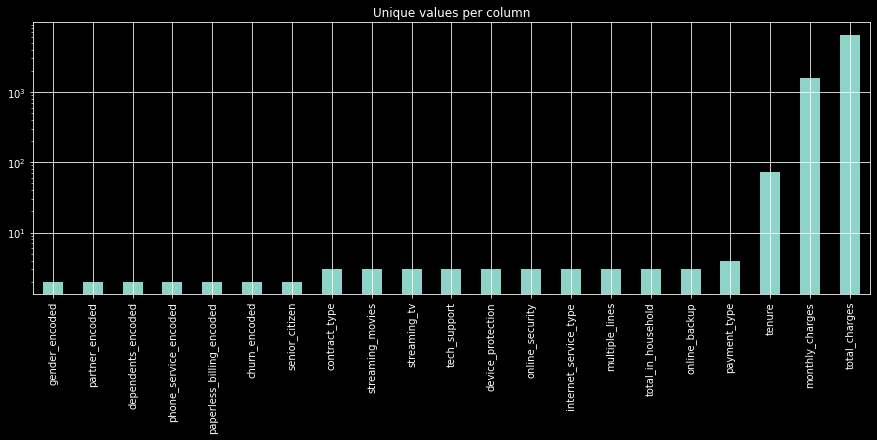

In [2]:


df=get_telco_clean()
train_telco,validate_telco,test_telco=telco_split(df)
df=train_telco
df.info()

In [3]:
# cols=set(df.columns)
# numcols={'tenure','monthly_charges','total_charges'}
# catcols=cols-numcols
# cat_wo_churn=catcols-{'churn_encoded'}
# cat_vs_num=list(product(numcols,catcols))
# no_churn_vs=list(product(numcols,cat_wo_churn))
# numcols_2_combos=list(combinations(numcols,2))
# catcols_2_combos=list(combinations(cat_wo_churn,2))##


# matching = {s for s in list(cat_wo_churn) if any(xs in s for xs in ['_encoded'])}
# toencode=cat_wo_churn-matching



# Preprocess
Here I made the dataset tidy. I coninued to make my graphs in this step as the datatypes were now formulated in way that gave me less errors. 

This is the Tidy Dataset:





,gender_encoded,partner_encoded,dependents_encoded,phone_service_encoded,paperless_billing_encoded,churn_encoded,senior_citizen,tenure,monthly_charges,total_charges,...,contract_type_month-to-month,contract_type_one_year,contract_type_two_year,internet_service_type_dsl,internet_service_type_fiber_optic,internet_service_type_none,payment_type_bank_transfer_(automatic),payment_type_credit_card_(automatic),payment_type_electronic_check,payment_type_mailed_check
head_1,1,1,1,1,1,0,0,9,65.6,593.3,...,0,1,0,1,0,0,0,0,0,1
head_2,0,0,0,1,0,0,0,9,59.9,542.4,...,1,0,0,1,0,0,0,0,0,1
head_3,0,0,0,1,1,1,0,4,73.9,280.85,...,1,0,0,0,1,0,0,0,1,0
dtypes,int64,int64,int64,int64,int64,int64,int64,int64,float64,object,...,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64
count,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043,...,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6531,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.495244,0.483033,0.299588,0.903166,0.592219,0.26537,0.162147,32.371149,64.761692,NaN,...,0.550192,0.209144,0.240664,0.343746,0.439585,0.216669,0.219225,0.216101,0.335794,0.22888
std,0.500013,0.499748,0.45811,0.295752,0.491457,0.441561,0.368612,24.559481,30.090047,NaN,...,0.49751,0.406726,0.427517,0.474991,0.496372,0.412004,0.413751,0.411613,0.472301,0.420141


(7043, 42)

<AxesSubplot:title={'center':'Unique values per column'}>

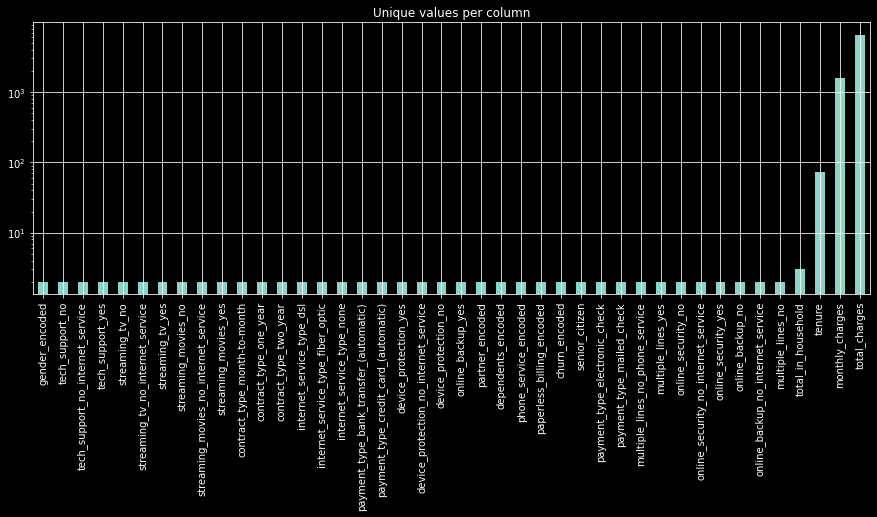

In [4]:
# in preprocess our we had to split our dataset before we imputed ' ' the monthly charges column with the mean and then cast the column as float. 


df=get_telco_tidy()

In [5]:
train_telco,validate_telco,test_telco=telco_split(df,stratify='churn_encoded')
## The imputing happens in this step
df=train_telco
df.info()

,Length,Width
Prepared Data,7043,42
Train,4225,42
Validate,1409,42
Test,1409,42


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4225 entries, 5911 to 3586
Data columns (total 42 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   gender_encoded                          4225 non-null   int64  
 1   partner_encoded                         4225 non-null   int64  
 2   dependents_encoded                      4225 non-null   int64  
 3   phone_service_encoded                   4225 non-null   int64  
 4   paperless_billing_encoded               4225 non-null   int64  
 5   churn_encoded                           4225 non-null   int64  
 6   senior_citizen                          4225 non-null   int64  
 7   tenure                                  4225 non-null   int64  
 8   monthly_charges                         4225 non-null   float64
 9   total_charges                           4225 non-null   float64
 10  total_in_household                      4225 non-null   i

# Explore: Start
-----


#### What do my numerical features look like?

We look at simple hist plots, then histplots encoded for churn. Finally we plot each against each other to get a feel for the significance correlation if it does indeed exist.


In [6]:
cols=set(df.columns)
numcols={'tenure','monthly_charges','total_charges'}
catcols=cols-numcols
cat_wo_churn=catcols-{'churn_encoded'}
cat_vs_num=list(product(numcols,catcols))
no_churn_vs=list(product(numcols,cat_wo_churn))
numcols_2_combos=list(combinations(numcols,2))
catcols_2_combos=list(combinations(cat_wo_churn,2))##
 ## These sets are created to run through my statistical and visual tests. 

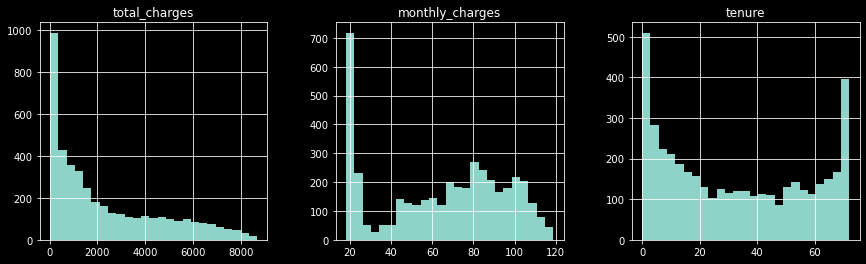

In [7]:
df[list(numcols)].hist(lw=0,
          bins=25,
          layout=(-1, 4),
          figsize=(20, 4),
          edgecolor='white',
         
          );

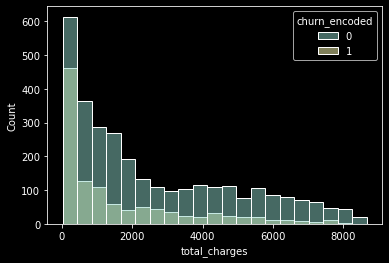

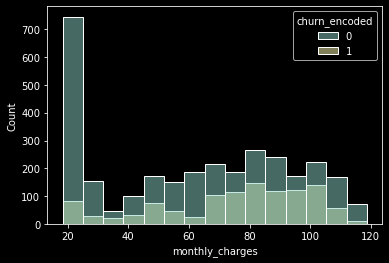

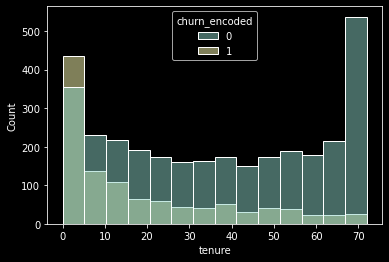

In [8]:
for i in list(numcols):

    sns.histplot(x=df[i],hue=df['churn_encoded'])
    plt.show()


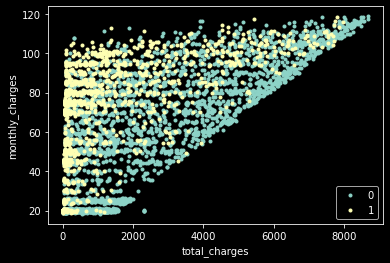

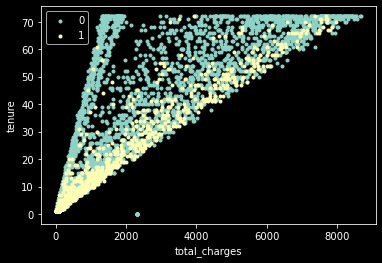

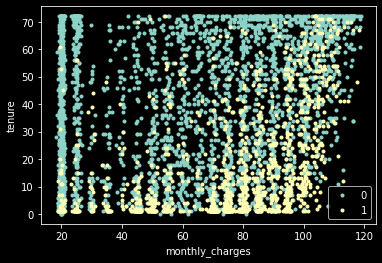

In [9]:
for i in numcols_2_combos:
    scatter_churn(df,x=i[0],y=i[1])
    plt.show()




#### Numerical with churn with columns isolated for household.
I was interested in if the number in a household affects the distributions numerical features. I was able to engineer this feature. However we can see that it is nearly the same distribution regardless of number in the household. We then look further but my visual graphs have 

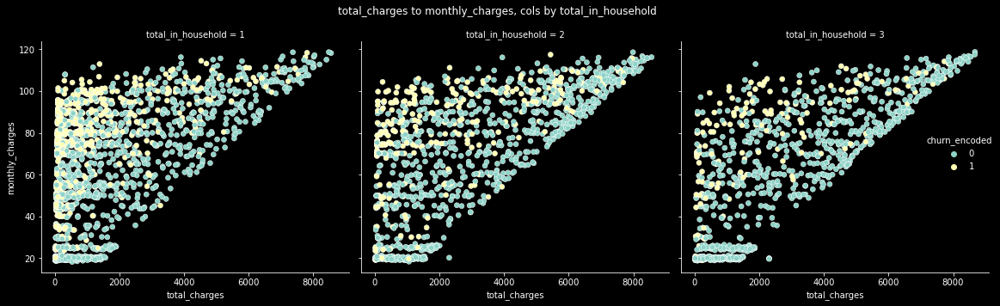

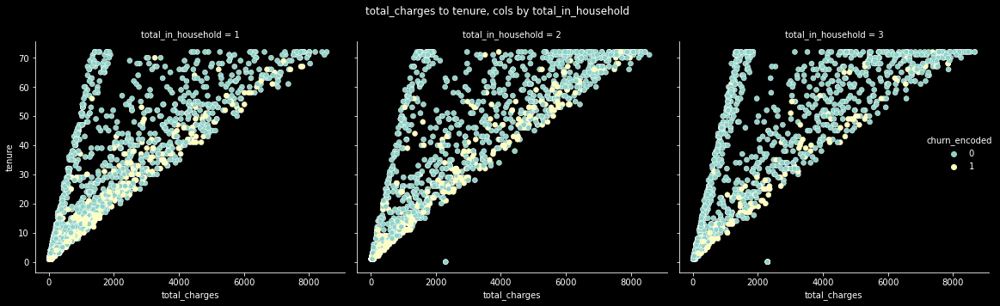

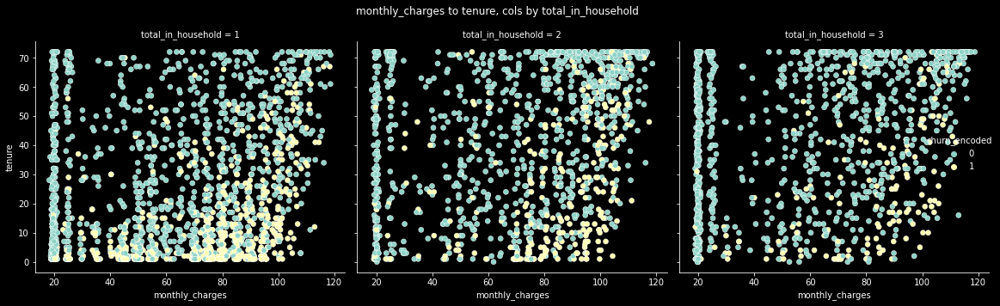

In [10]:
for i in (numcols_2_combos):
    rel = sns.relplot(x=i[0], y=i[1], data=df, col='total_in_household',hue="churn_encoded")
    rel.fig.suptitle(f'{i[0]} to {i[1]}, cols by total_in_household') # One way to title a relplot
    plt.tight_layout()    


cat_wo_chn_house=cat_wo_churn-{'total_in_household'}
for i in list(cat_wo_chn_house):  
    plt.title("House size")
    sns.barplot(x="total_in_household", y=f'{i}', hue='churn_encoded', data=df)
    churn_rate = df[f'{i}'][df.churn_encoded==1].mean()
    # plt.axhline(churn_rate, label=f'{i}churn%')
    plt.legend()
    plt.show()

# Stats Test: Correlation
First we compare all the numerical features for correlation both Pearson and Spearman. Then since we see they are very simular, we focus on pearson and create a heatmap to see the strength of linear correlations.

In [11]:
num_to_num(df,numcols_2_combos)



Correlation

,"(total_charges, monthly_charges)","(total_charges, tenure)","(monthly_charges, tenure)"
Pearson r,0.6536,0.822,0.2471
Pearson p stat,0,0,8.064e-60
pearson p test,We reject our null hypothesis.,We reject our null hypothesis.,We reject our null hypothesis.
Spearman rho,0.642,0.8815,0.2765
Spearman p stat,0,0,5.358e-75
spearman ptest,We reject our null hypothesis.,We reject our null hypothesis.,We reject our null hypothesis.


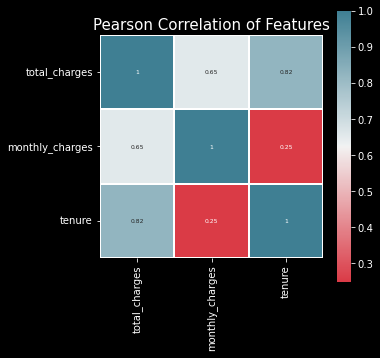

In [12]:
figlen=len(list(numcols))+2

plt.figure(figsize=(figlen,figlen))
plt.title('Pearson Correlation of Features', size = 15)
colormap = sns.diverging_palette(10, 220, as_cmap = True)
sns.heatmap(df[list(numcols)].corr(),
            cmap = colormap,
            square = True,
            annot = True,
            linewidths=0.1,vmax=1.0, linecolor='white',
            annot_kws={'fontsize':6 })
plt.show()

# Stats Test: $\chi^2$
Here I test all the categorical types in aggregate to see which are correlated and then which are not.

In [13]:
chi2rej=cat_to_cat(df,(catcols_2_combos),rejected_chi=True)
chi2rej[chi2rej['Chi Square p'].astype(float)<chi2rej['Chi Square p'].astype(float).quantile(1-.09)].sort_values('Chi Square p')

\chi^2

We~reject~the~null~hypothesis

Thus~dependendace~is~likely

,Chi Square Stat,Chi Square p,Vars
0,894.1,1.905e-196,online_backup_no/streaming_movies_no_internet_...
1,211.1,8.075e-48,online_backup_no/internet_service_type_fiber_o...
2,237.5,1.347e-53,online_backup_no/payment_type_electronic_check
3,894.1,1.905e-196,online_backup_no/online_security_no_internet_s...
4,76.55,2.146e-18,online_backup_no/dependents_encoded
...,...,...,...
571,398.2,1.384e-88,streaming_tv_no/internet_service_type_dsl
572,482.5,6.177e-107,streaming_tv_no/tech_support_no
573,734.4,1.014e-161,streaming_tv_no/device_protection_no
574,130.6,3.077e-30,internet_service_type_dsl/device_protection_no


,Chi Square Stat,Chi Square p,Vars
250,4219,0,tech_support_no_internet_service/internet_serv...
25,1724,0,online_backup_no/online_backup_yes
351,4219,0,streaming_tv_no_internet_service/internet_serv...
370,4219,0,online_backup_no_internet_service/internet_ser...
57,4219,0,streaming_movies_no_internet_service/internet_...
...,...,...,...
502,50.93,9.558e-13,streaming_movies_no/contract_type_one_year
119,114.6,9.742e-27,payment_type_electronic_check/senior_citizen
499,110.6,9.812e-25,total_in_household/device_protection_no
510,380.5,9.86e-85,streaming_movies_no/internet_service_type_dsl


In [14]:
chi2accept=cat_to_cat(df,(catcols_2_combos),rejected_chi=False)
chi2accept[chi2accept['Chi Square p'].astype(float)<chi2accept['Chi Square p'].astype(float).quantile(.09)].sort_values('Chi Square p')

\chi^2

We~accept~the~null~hypothesis

Thus~independence~is~likely

,Chi Square Stat,Chi Square p,Vars
0,3.001,0.08324,online_backup_no/device_protection_yes
1,0.3154,0.5744,online_backup_no/tech_support_yes
2,0.113,0.7368,online_backup_no/online_security_yes
3,1.303,0.2536,online_backup_no/multiple_lines_yes
4,0.06977,0.7917,online_backup_no/gender_encoded
...,...,...,...
122,0.6442,0.4222,gender_encoded/tech_support_no
123,0.205,0.6507,gender_encoded/device_protection_no
124,3.183,0.07442,partner_encoded/senior_citizen
125,0.1838,0.6681,partner_encoded/internet_service_type_dsl


,Chi Square Stat,Chi Square p,Vars
53,3.83,0.05033,multiple_lines_no_phone_service/streaming_movi...
92,3.83,0.05033,streaming_movies_yes/phone_service_encoded
83,3.674,0.05527,online_security_no/internet_service_type_dsl
26,3.575,0.05867,dependents_encoded/multiple_lines_no
105,3.362,0.06672,online_security_yes/senior_citizen
9,3.272,0.07048,internet_service_type_fiber_optic/tech_support...
124,3.183,0.07442,partner_encoded/senior_citizen
96,3.182,0.07445,contract_type_two_year/gender_encoded
44,3.151,0.07589,streaming_tv_yes/device_protection_no
0,3.001,0.08324,online_backup_no/device_protection_yes


# Stats Test: Mann-Whitney
Here I test all the categorical vs numerical types in aggregate to see which are related.\
i.e. we consider if it is likely that they come from the same population.

In [15]:
manwhitreject=cat_to_num(df,no_churn_vs,rejected_null=True)

Mann~Whitney

We~reject~the~null~hypothesis

Hence~it~is~unlikely~they~are~from~same~population

,Man Whit Stat,Alt p p,Vars
0,0,0,total_charges/online_backup_no
1,0,0,total_charges/streaming_movies_no_internet_ser...
2,0,0,total_charges/internet_service_type_fiber_optic
3,0,0,total_charges/payment_type_electronic_check
4,0,0,total_charges/online_security_no_internet_service
...,...,...,...
109,1.45e+05,0,tenure/senior_citizen
110,3.21e+05,0,tenure/streaming_tv_no
111,2.85e+05,0,tenure/internet_service_type_dsl
112,4.01e+05,0,tenure/tech_support_no


In [16]:
manwhitaccept=cat_to_num(df,no_churn_vs,rejected_null=False)
len(manwhitaccept)

Mann~Whitney

We~accept~the~null~hypothesis

Hence~it~is~likely~they~are~from~same~population

""


0

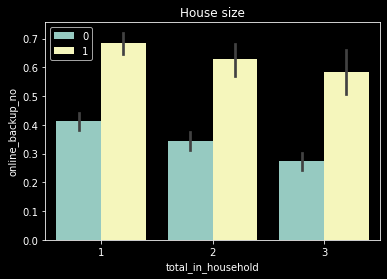

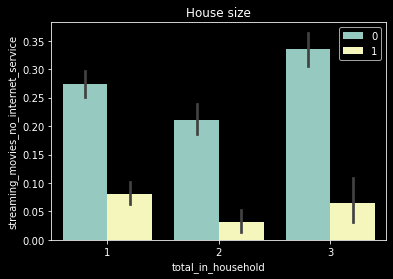

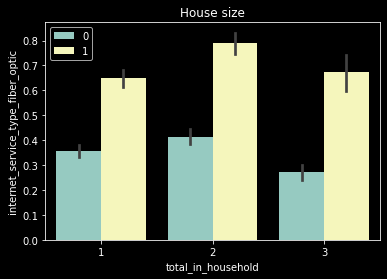

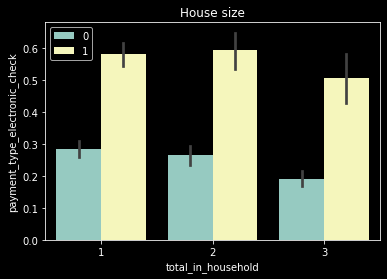

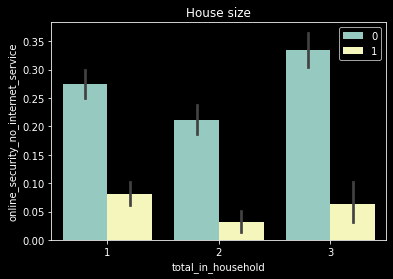

...

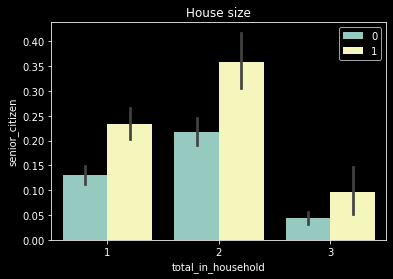

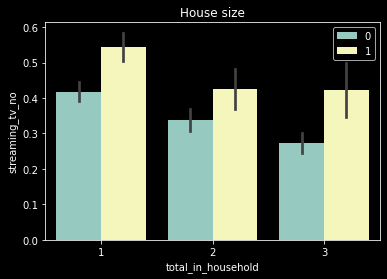

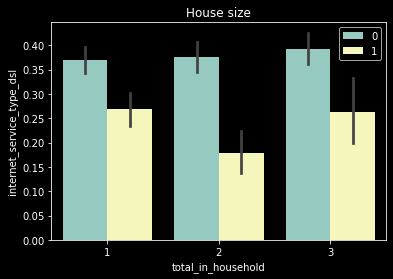

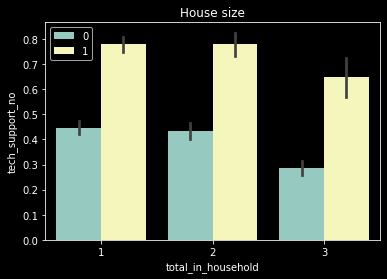

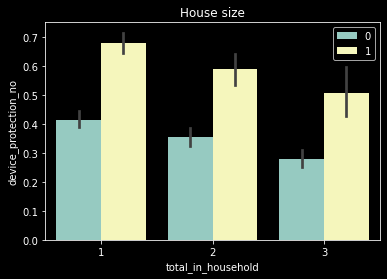

# Explore: Finished
-----

# Model:
Here we have a crucial step where we take our tidy data and run some models on it. Selecting the right model is a bit of trial and error. However you can optimize they models themselves by running a grid search on the model's hyperparameters which is what I did here. Doing so minimimized the trial and error on my end and allowed our models to have a significant imporvent over baseline withou overfitting as we are able to see by comparing them on to the validate set. After experimentation whith each model, we pick the best one to run our test on and obtain predictions. All of our work led up to this step.


This is the Tidy Dataset:





,gender_encoded,partner_encoded,dependents_encoded,phone_service_encoded,paperless_billing_encoded,churn_encoded,senior_citizen,tenure,monthly_charges,total_charges,...,contract_type_month-to-month,contract_type_one_year,contract_type_two_year,internet_service_type_dsl,internet_service_type_fiber_optic,internet_service_type_none,payment_type_bank_transfer_(automatic),payment_type_credit_card_(automatic),payment_type_electronic_check,payment_type_mailed_check
head_1,1,1,1,1,1,0,0,9,65.6,593.3,...,0,1,0,1,0,0,0,0,0,1
head_2,0,0,0,1,0,0,0,9,59.9,542.4,...,1,0,0,1,0,0,0,0,0,1
head_3,0,0,0,1,1,1,0,4,73.9,280.85,...,1,0,0,0,1,0,0,0,1,0
dtypes,int64,int64,int64,int64,int64,int64,int64,int64,float64,object,...,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64
count,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043,...,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0,7043.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6531,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.495244,0.483033,0.299588,0.903166,0.592219,0.26537,0.162147,32.371149,64.761692,NaN,...,0.550192,0.209144,0.240664,0.343746,0.439585,0.216669,0.219225,0.216101,0.335794,0.22888
std,0.500013,0.499748,0.45811,0.295752,0.491457,0.441561,0.368612,24.559481,30.090047,NaN,...,0.49751,0.406726,0.427517,0.474991,0.496372,0.412004,0.413751,0.411613,0.472301,0.420141


(7043, 42)

<AxesSubplot:title={'center':'Unique values per column'}>

,Length,Width
Prepared Data,7043,42
Train,4225,42
Validate,1409,42
Test,1409,42


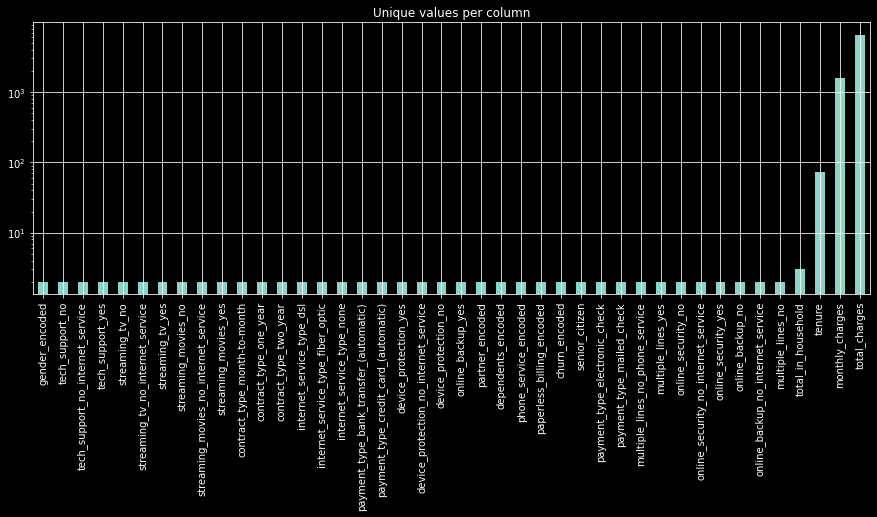

In [18]:
random=4563
df=get_telco_tidy()

X_train,y_train,X_validate,y_validate,X_test,y_test,train,validate,test=X_y_all(df)#split our data one last time to target

In [19]:
# Establish our baseline prediction 
baseline = y_train.mode()

# Next let establish a baseline accuracy
matches_baseline_prediction = y_train == 0

baseline_accuracy = matches_baseline_prediction.mean()
print(f"Baseline prediction: {baseline[0]}")
print(f"Baseline accuracy: {round(baseline_accuracy, 2)}")





Baseline prediction: 0
Baseline accuracy: 0.73


# Model Fitting:

---- 


# RandomForest

Random~Forest

,"Parameters:{'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 100, 'random_state': 4563}]"
diff,0.0
train_score,0.8
validate_score,0.8


,0,1,accuracy,macro avg,weighted avg
precision,0.824556,0.694938,0.80213,0.759747,0.790165
recall,0.928157,0.453167,0.80213,0.690662,0.802130
f1-score,0.873295,0.548596,0.80213,0.710946,0.787144
support,3104.000000,1121.000000,0.80213,4225.000000,4225.000000


Matrix([
[2881, 223],
[ 613, 508]])

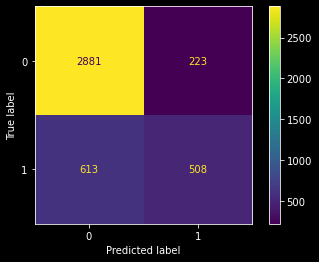

In [20]:
random_forest(X_train,y_train,X_validate,y_validate,X_test,y_test,random)

# KNN

KNN

,"Parameters:{'leaf_size': 20, 'n_neighbors': 6, 'p': 1, 'weights': 'uniform'}]"
diff,0.04
train_score,0.82
validate_score,0.78


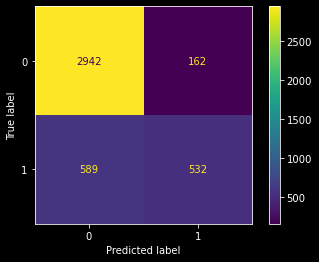

In [21]:
knn(X_train,y_train,X_validate,y_validate,X_test,y_test)

# Decision Tree


Decision~Tree~Classifier

,"Parameters:{'ccp_alpha': 0.0, 'class_weight': 'balanced', 'max_depth': 8, 'max_features': 'log2', 'random_state': 4563}]"
diff,0.02
train_score,0.76
validate_score,0.74


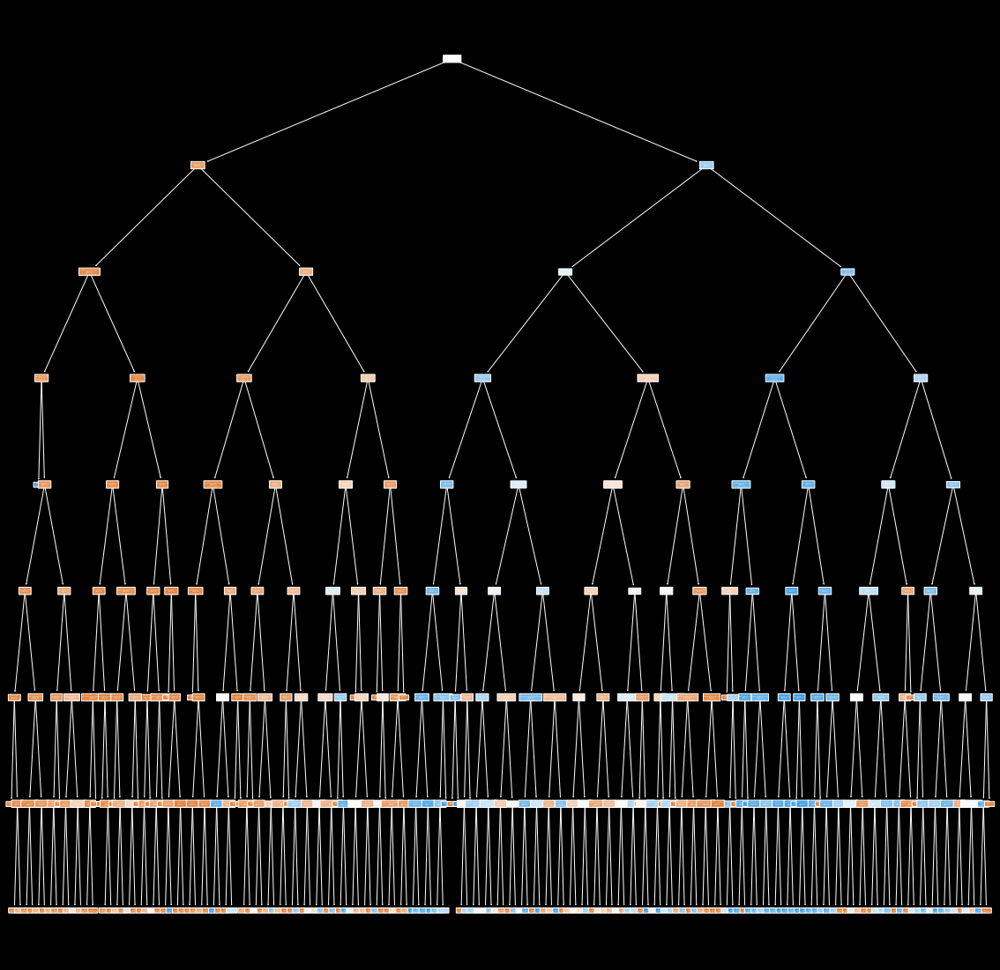

In [22]:
decision_tree(X_train,y_train,X_validate,y_validate,X_test,y_test,random)

# Logistic Regression

Logistic~Regression

,"Parameters:{'C': 5.336699231206307, 'class_weight': 'balanced', 'max_iter': 500, 'penalty': 'l2', 'solver': 'lbfgs', 'random_state': 4563}]"
diff,0.01
train_score,0.75
validate_score,0.76


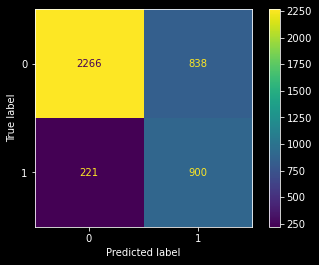

,0,1,accuracy,macro avg,weighted avg
precision,0.911138,0.517837,0.749349,0.714487,0.806785
recall,0.730026,0.802855,0.749349,0.766440,0.749349
f1-score,0.810588,0.629591,0.749349,0.720090,0.762565
support,3104.000000,1121.000000,0.749349,4225.000000,4225.000000


In [23]:
logistic_reg(X_train,y_train,X_validate,y_validate,X_test,y_test,random)

# Model Takeaways

I ran several models and optimized them for precision.  The best had the highest score value and smallest difference between the validate and train.

I was able to use a built in function called gridsearch to find the best hyperparmeters for each model.

Random~Forest~Test

,"Parameters:{'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 100, 'random_state': 4563}]"
diff train test,0.0
test_score,0.8
train_score,0.8
validate_score,0.8


,0,1,accuracy,macro avg,weighted avg
precision,0.828371,0.666667,0.797729,0.747519,0.785449
recall,0.914010,0.475936,0.797729,0.694973,0.797729
f1-score,0.869086,0.555382,0.797729,0.712234,0.785817
support,1035.000000,374.000000,0.797729,1409.000000,1409.000000


Matrix([
[946,  89],
[196, 178]])

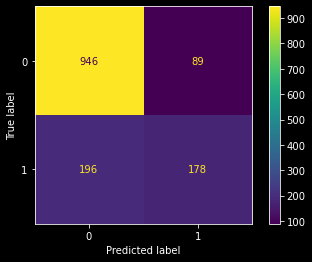

In [24]:
opt_rf=best_model(X_train,y_train,X_validate,y_validate,X_test,y_test)



# Predictions CSV

In [25]:
proba_test = opt_rf.predict_proba(X_test)
predicted_test = opt_rf.predict(X_test)
proba_df = pd.DataFrame(proba_test, columns=opt_rf.classes_.tolist())
proba_df.head()
reset_test = test.reset_index()
reset_test.head()
test_proba_df = pd.concat([reset_test, proba_df], axis=1)
test_proba_df.head()
test_proba_df['predicted'] = predicted_test
test_proba_df.head()
names=df.columns.to_list()
csv_df = test_proba_df[names]
csv_df.head()
# Write DataFrame to a csv file for deliverable.

csv_df.to_csv('predictions.csv')

## Executive Summary:

#### Conclusion:
We beat the baseline with our models. 

Hence, their predictive power is useful.

More data might highlight some interesting relationships.

#### Specific Recommendations:
It would be nice to obtain more quantitative data related to the projected disposable income of each household. 

#### Actionable Example:
Offer a Telco credit card. In doing so, we are able to collect more quantitative information on credit ratings and household income. This could give us insights on the projected disposable income of each household. The goal being to maximize profits by the data gained and perhaps offering incentives that diminish churn.


#### Closing Quote:
>
>“Errors using inadequate data are much less than those using no data at all.”
(Charles Babbage, English Mathematician)


# Best Model Test 
Here I will use the best model which is random forest as my test.